In [21]:
!pip install --upgrade pip
!pip install pennylane
!pip install tqdm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 10.6 MB/s eta 0:00:00


In [22]:
import pennylane as qml
from pennylane import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import json

#The following data distributions are replicated in python

##Uniform Distribution:
Every bitstring has a non-zero probability amplitude, making it a dense distribution.

##Sparse Distribution:
This distribution has randomly selected bitstrings, each with a non-zero probability amplitude.

##Bell State:
Used for training 2-qubit QCBMs, it is a sparse distribution where only specific bitstrings have non-zero probability amplitudes.

##GHZ State:
A sparse distribution used for training QCBMs with n ≥ 3.

##W State:
This is another sparse distribution, but it's specifically used for training 3-qubit QCBMs.

##HEP Distribution:
This is a dense distribution derived from approximately 4 million samples from the kinematic distributions of leading jets in simulations of jet pair production at the Large Hadron Collider. It was used for training QCBMs with n ≥ 4.

In [23]:
def generate_uniform_distribution(n_qubits):
    """Generate a uniform distribution over 2^n_qubits bitstrings."""
    size = 2**n_qubits
    return np.ones(size) / size


def generate_sparse_distribution(n_qubits, sparsity=0.5):
    """Generate a sparse distribution with a given sparsity level."""
    size = 2**n_qubits
    num_non_zero = int(size * sparsity)
    distribution = np.zeros(size)
    non_zero_indices = np.random.choice(size, num_non_zero, replace=False)
    distribution[non_zero_indices] = 1 / num_non_zero
    return distribution


def generate_bell_state_distribution():
    """Generate a distribution representing a Bell state for 2 qubits."""
    distribution = np.zeros(4)
    distribution[0] = 0.5  # |00⟩ state
    distribution[3] = 0.5  # |11⟩ state
    return distribution


def generate_ghz_state_distribution(n_qubits):
    """Generate a distribution representing a GHZ state."""
    size = 2**n_qubits
    distribution = np.zeros(size)
    distribution[0] = 0.5  # |00...0⟩ state
    distribution[-1] = 0.5  # |11...1⟩ state
    return distribution


def generate_w_state_distribution():
    """Generate a distribution representing a W state for 3 qubits."""
    distribution = np.zeros(8)
    distribution[1] = 1 / 3  # |001⟩ state
    distribution[2] = 1 / 3  # |010⟩ state
    distribution[4] = 1 / 3  # |100⟩ state
    return distribution


def generate_hep_distribution(n_qubits):
    """Generate a simplified version of the HEP distribution."""
    # This is a placeholder for a complex HEP-related distribution.

    size = 2**n_qubits
    distribution = np.random.rand(size)
    distribution /= np.sum(distribution)  # Normalize the distribution
    return distribution


#'''
# Example usage:

n_qubits = 4
uniform_dist = generate_uniform_distribution(n_qubits)
sparse_dist = generate_sparse_distribution(n_qubits)
bell_dist = generate_bell_state_distribution()  # Only for 2 qubits
ghz_dist = generate_ghz_state_distribution(n_qubits)
w_dist = generate_w_state_distribution()  # Only for 3 qubits
hep_dist = generate_hep_distribution(n_qubits)

print("Uniform Distribution:", uniform_dist)
print("Sparse Distribution:", sparse_dist)
print("Bell State Distribution:", bell_dist)
print("GHZ State Distribution:", ghz_dist)
print("W State Distribution:", w_dist)
print("HEP Distribution:", hep_dist)
#'''


Uniform Distribution: [0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0625 0.0625
 0.0625 0.0625 0.0625 0.0625 0.0625 0.0625]
Sparse Distribution: [0.    0.125 0.    0.    0.125 0.125 0.    0.    0.    0.    0.125 0.125
 0.    0.125 0.125 0.125]
Bell State Distribution: [0.5 0.  0.  0.5]
GHZ State Distribution: [0.5 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.5]
W State Distribution: [0.         0.33333333 0.33333333 0.         0.33333333 0.
 0.         0.        ]
HEP Distribution: [0.08144722 0.06016885 0.10910184 0.04182625 0.10670595 0.02063098
 0.07829827 0.00556599 0.0322621  0.05694416 0.05007589 0.05500921
 0.08237424 0.05803407 0.10334318 0.05821181]


# Quantum Circuit Ansatz

This notebook demonstrates the implementation of a quantum circuit ansatz using the PennyLane library. The `ansatz` function is based on the hardware effcient antaz defiened in the paper.

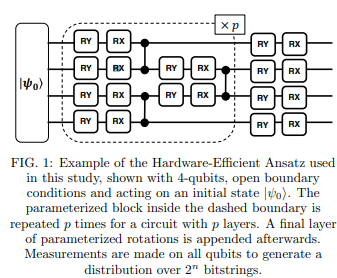


## Code Explanation

The `ansatz` function takes the following parameters:
- `params`: The parameters for the quantum circuit.
- `num_layers`: The number of layers in the circuit.
- `num_qubits`: The number of qubits in the circuit.

The function applies a series of quantum gates and operations based on the number of qubits and layers specified. It supports circuits with 2, 3, 4, 6, and 8 qubits.

The general structure of the circuit is as follows:
1. For each layer:
   - Apply RY and RX gates to the qubits.
   - Apply CNOT gates between specific qubit pairs.
   - Apply additional RY and RX gates to certain qubits.
   - Apply more CNOT gates between specific qubit pairs.
2. After the layers, apply a final set of RY and RX gates to all qubits.

The specific gates and their parameters are determined by the `params` array and the `start_idx` variable, which keeps track of the current index in the `params` array.

The `params` are set up such that it follows the given formula
```
num_params = num_layers * 4 * (num_qubits - 1) + 2 * num_qubits
```

In [4]:
def ansatz(params, num_layers, num_qubits):
    params_per_layer = 4 * (
        num_qubits - 1
    )  # 8 for rotations on all qubits, 4 for additional rotations on qubits 1 and 2
    if num_qubits == 4:
        for layer in range(num_layers):
            start_idx = layer * params_per_layer

            # First set of RY and RX for all qubits

            qml.RY(params[start_idx + 0], wires=0)
            qml.RY(params[start_idx + 1], wires=1)
            qml.RY(params[start_idx + 2], wires=2)
            qml.RY(params[start_idx + 3], wires=3)
            qml.RX(params[start_idx + 4], wires=0)
            qml.RX(params[start_idx + 5], wires=1)
            qml.RX(params[start_idx + 6], wires=2)
            qml.RX(params[start_idx + 7], wires=3)

            # CNOT operations between qubit pairs (0, 1) and (2, 3)

            qml.CNOT(wires=[0, 1])
            qml.CNOT(wires=[2, 3])

            # Additional RY and RX on qubits 1 and 2

            qml.RY(params[start_idx + 8], wires=1)
            qml.RX(params[start_idx + 9], wires=1)
            qml.RY(params[start_idx + 10], wires=2)
            qml.RX(params[start_idx + 11], wires=2)

            # Another CNOT between qubits 1 and 2

            qml.CNOT(wires=[1, 2])
        start_idx = num_layers * params_per_layer
        qml.RY(params[start_idx + 0], wires=0)
        qml.RY(params[start_idx + 1], wires=1)
        qml.RY(params[start_idx + 2], wires=2)
        qml.RY(params[start_idx + 3], wires=3)
        qml.RX(params[start_idx + 4], wires=0)
        qml.RX(params[start_idx + 5], wires=1)
        qml.RX(params[start_idx + 6], wires=2)
        qml.RX(params[start_idx + 7], wires=3)
    if num_qubits == 6:
        for layer in range(num_layers):
            start_idx = layer * params_per_layer

            # First set of RY and RX for all qubits

            qml.RY(params[start_idx + 0], wires=0)
            qml.RY(params[start_idx + 1], wires=1)
            qml.RY(params[start_idx + 2], wires=4)
            qml.RY(params[start_idx + 3], wires=5)
            qml.RX(params[start_idx + 4], wires=0)
            qml.RX(params[start_idx + 5], wires=1)
            qml.RX(params[start_idx + 6], wires=4)
            qml.RX(params[start_idx + 7], wires=5)

            qml.CNOT(wires=[0, 1])
            qml.CNOT(wires=[4, 5])

            qml.RY(params[start_idx + 8], wires=1)
            qml.RY(params[start_idx + 9], wires=2)
            qml.RY(params[start_idx + 10], wires=3)
            qml.RY(params[start_idx + 11], wires=4)
            qml.RX(params[start_idx + 12], wires=1)
            qml.RX(params[start_idx + 13], wires=2)
            qml.RX(params[start_idx + 14], wires=3)
            qml.RX(params[start_idx + 15], wires=4)

            qml.CNOT(wires=[1, 2])
            qml.CNOT(wires=[3, 4])

            qml.RY(params[start_idx + 16], wires=2)
            qml.RY(params[start_idx + 17], wires=2)
            qml.RX(params[start_idx + 18], wires=3)
            qml.RX(params[start_idx + 19], wires=3)

            qml.CNOT(wires=[2, 3])
        start_idx = num_layers * params_per_layer
        qml.RY(params[start_idx + 0], wires=0)
        qml.RY(params[start_idx + 1], wires=1)
        qml.RY(params[start_idx + 2], wires=2)
        qml.RY(params[start_idx + 3], wires=3)
        qml.RY(params[start_idx + 4], wires=4)
        qml.RY(params[start_idx + 5], wires=5)
        qml.RX(params[start_idx + 6], wires=0)
        qml.RX(params[start_idx + 7], wires=1)
        qml.RX(params[start_idx + 8], wires=2)
        qml.RX(params[start_idx + 9], wires=3)
        qml.RX(params[start_idx + 10], wires=4)
        qml.RX(params[start_idx + 11], wires=5)
    if num_qubits == 2:
        for layer in range(num_layers):
            start_idx = layer * params_per_layer

            # First set of RY and RX for all qubits

            qml.RY(params[start_idx + 0], wires=0)
            qml.RY(params[start_idx + 1], wires=1)
            qml.RX(params[start_idx + 2], wires=0)
            qml.RX(params[start_idx + 3], wires=1)

            qml.CNOT(wires=[0, 1])
        start_idx = num_layers * params_per_layer
        qml.RY(params[start_idx + 0], wires=0)
        qml.RY(params[start_idx + 1], wires=1)
        qml.RX(params[start_idx + 2], wires=0)
        qml.RX(params[start_idx + 3], wires=1)
    if num_qubits == 8:
        for layer in range(num_layers):
            start_idx = layer * params_per_layer

            # First set of RY and RX for all qubits

            qml.RY(params[start_idx + 0], wires=0)
            qml.RY(params[start_idx + 1], wires=1)
            qml.RY(params[start_idx + 2], wires=6)
            qml.RY(params[start_idx + 3], wires=7)
            qml.RX(params[start_idx + 4], wires=0)
            qml.RX(params[start_idx + 5], wires=1)
            qml.RX(params[start_idx + 6], wires=6)
            qml.RX(params[start_idx + 7], wires=7)

            qml.CNOT(wires=[0, 1])
            qml.CNOT(wires=[6, 7])

            qml.RY(params[start_idx + 8], wires=1)
            qml.RY(params[start_idx + 9], wires=2)
            qml.RY(params[start_idx + 10], wires=5)
            qml.RY(params[start_idx + 11], wires=6)
            qml.RX(params[start_idx + 12], wires=1)
            qml.RX(params[start_idx + 13], wires=2)
            qml.RX(params[start_idx + 14], wires=5)
            qml.RX(params[start_idx + 15], wires=6)

            qml.CNOT(wires=[1, 2])
            qml.CNOT(wires=[5, 6])

            qml.RY(params[start_idx + 16], wires=2)
            qml.RY(params[start_idx + 17], wires=3)
            qml.RY(params[start_idx + 18], wires=4)
            qml.RY(params[start_idx + 19], wires=5)
            qml.RX(params[start_idx + 20], wires=2)
            qml.RX(params[start_idx + 21], wires=3)
            qml.RX(params[start_idx + 22], wires=4)
            qml.RX(params[start_idx + 23], wires=5)

            qml.CNOT(wires=[2, 3])
            qml.CNOT(wires=[4, 5])

            qml.RY(params[start_idx + 24], wires=3)
            qml.RY(params[start_idx + 25], wires=4)
            qml.RX(params[start_idx + 26], wires=3)
            qml.RX(params[start_idx + 27], wires=4)

            qml.CNOT(wires=[3, 4])
        start_idx = num_layers * params_per_layer
        qml.RY(params[start_idx + 0], wires=0)
        qml.RY(params[start_idx + 1], wires=1)
        qml.RY(params[start_idx + 2], wires=2)
        qml.RY(params[start_idx + 3], wires=3)
        qml.RY(params[start_idx + 4], wires=4)
        qml.RY(params[start_idx + 5], wires=5)
        qml.RY(params[start_idx + 6], wires=6)
        qml.RY(params[start_idx + 7], wires=7)
        qml.RX(params[start_idx + 8], wires=0)
        qml.RX(params[start_idx + 9], wires=1)
        qml.RX(params[start_idx + 10], wires=2)
        qml.RX(params[start_idx + 11], wires=3)
        qml.RX(params[start_idx + 12], wires=4)
        qml.RX(params[start_idx + 13], wires=5)
        qml.RX(params[start_idx + 14], wires=6)
        qml.RX(params[start_idx + 15], wires=7)
    if num_qubits == 3:
        for layer in range(num_layers):
            start_idx = layer * params_per_layer

            # First set of RY and RX for all qubits

            qml.RY(params[start_idx + 0], wires=0)
            qml.RY(params[start_idx + 1], wires=1)
            qml.RX(params[start_idx + 2], wires=0)
            qml.RX(params[start_idx + 3], wires=1)

            qml.CNOT(wires=[0, 1])

            qml.RY(params[start_idx + 0], wires=1)
            qml.RY(params[start_idx + 1], wires=2)
            qml.RX(params[start_idx + 2], wires=1)
            qml.RX(params[start_idx + 3], wires=2)

            qml.CNOT(wires=[1, 2])
        start_idx = num_layers * params_per_layer
        qml.RY(params[start_idx + 0], wires=0)
        qml.RY(params[start_idx + 1], wires=1)
        qml.RY(params[start_idx + 2], wires=2)
        qml.RX(params[start_idx + 3], wires=0)
        qml.RX(params[start_idx + 4], wires=1)
        qml.RX(params[start_idx + 5], wires=2)


num_qubits = 3
num_layers = 0

# Initialize the device

dev = qml.device("default.qubit", wires=num_qubits)

# Wrap the ansatz in a QNode


@qml.qnode(dev)
def circuit(params, num_layers):
    ansatz(params, num_layers, num_qubits=num_qubits)
    return qml.state()


params_per_layer = 4 * (num_qubits - 1)
# 8 for rotations on all qubits, 4 for additional rotations on qubits 1 and 2
# Set up the parameters for two layers


params = np.random.random(
    size=num_layers * params_per_layer + 2 * num_qubits
)  # 24 parameters in total


# Draw the circuit for two layers

print(qml.draw(circuit)(params, num_layers=num_layers))


0: ──RY(0.38)──RX(0.38)─┤  State
1: ──RY(0.87)──RX(0.14)─┤  State
2: ──RY(0.80)──RX(0.16)─┤  State


# Kullback-Leibler Divergence and Jensen-Shannon Divergence

This code block demonstrates the implementation of the Kullback-Leibler Divergence (KLD) and Jensen-Shannon Divergence (JSD) functions, as well as a loss function based on JSD for comparing probability distributions.

## Code Explanation

### Kullback-Leibler Divergence (KLD)

The `KLD` function calculates the Kullback-Leibler Divergence between two probability distributions `P` and `Q`. KLD measures the difference between two probability distributions, quantifying the information lost when `Q` is used to approximate `P`.

The function takes the following parameters:
- `P` (array): The true probability distribution.
- `Q` (array): The approximate probability distribution.

It returns the KLD value as a float.

The function first ensures that the input distributions are NumPy arrays and have no zeros (to avoid division by zero). It then calculates the KLD using the formula:

```
KLD(P || Q) = sum(P * log(P / Q))
```

### Jensen-Shannon Divergence (JSD)

The `JSD` function calculates the Jensen-Shannon Divergence between two probability distributions `P` and `Q`. JSD is a symmetrized and smoothed version of KLD, measuring the similarity between two probability distributions.

The function takes the following parameters:
- `P` (array): The first probability distribution.
- `Q` (array): The second probability distribution.

It returns the JSD value as a float.

The function calculates the JSD using the formula:

```
JSD(P || Q) = 0.5 * (KLD(P || (P+Q)/2) + KLD(Q || (P+Q)/2))
```

### Loss Function

The `loss` function calculates the loss based on the Jensen-Shannon divergence for the given data and model.

The function takes the following parameters:
- `data` (array): The true probability distribution from the data.
- `model` (callable): The model function that generates the probability distribution.
- `params` (array): The parameters for the model.

It returns the loss value as a float.

The function calls the `model` function with the provided `params` to generate the approximate probability distribution `Q`. It then calculates the JSD between the true distribution `data` and the generated distribution `Q` using the `JSD` function.


In [5]:
def KLD(P, Q):
    """
    Calculate the Kullback-Leibler Divergence between two probability distributions P and Q.

    Parameters:
    P (array): The true probability distribution.
    Q (array): The approximate probability distribution.

    Returns:
    float: The Kullback-Leibler Divergence.
    """
    # Ensure the distributions are np arrays and have no zeros (to avoid division by zero)

    P = np.clip(P, 1e-100, 1)
    Q = np.clip(Q, 1e-100, 1)

    # Calculate the KLD

    return np.sum(P * np.log(P / Q))


def JSD(P, Q):
    """Calculate the Jensen-Shannon Divergence between two probability distributions P and Q."""
    M = 0.5 * (P + Q)
    return 0.5 * (KLD(P, M) + KLD(Q, M))


def loss(data, model, params):
    """
    Calculate the loss based on the Jensen-Shannon divergence for the given data and model.

    Parameters:
    data (array): The true probability distribution from the data.
    model (callable): The model function that generates the probability distribution.
    params (array): The parameters for the model.

    Returns:
    float: The loss value.
    """
    Q = np.array(model(params))
    return JSD(data, Q)


# QCBM Optimizer

This codeblock demonstrates the implementation of the QCBM optimizer. The `optimizer` function optimizes the parameters of a QCBM to minimize the loss between the generated probability distribution and a given dataset.


## Code Explanation

The `optimizer` function takes the following parameters:
- `num_qubits`: The number of qubits in the quantum circuit.
- `num_layers`: The number of layers in the ansatz.
- `dataset`: The target probability distribution to be approximated by the QCBM.

The function performs the following steps:
1. It creates a quantum device using `qml.device()` with the specified number of qubits.

2. It defines an `encode` function that initializes the qubits to the computational basis state |0...0⟩.

3. It defines a quantum circuit Born machine (QCBM) using the `@qml.qnode` decorator. The QCBM applies the `encode` function and the `ansatz` function (can be seen above) to the qubits, and returns the probability distribution using `qml.probs()`.

4. It initializes the parameters of the QCBM randomly using `np.random.uniform()` This probablity distribution lies between `0` and `2π`.

5. It sets up an optimizer (`qml.AdamOptimizer`) with a specified step size and other hyperparameters. These hyperparameters follow what is specificied in the paper with `alpha=0.01, beta1=0.9, beta2=0.999`

6. It runs the optimization loop for a 200 iterations (`num_its`). In each iteration:
   - It computes the gradients and updates the parameters using the `opt.step_and_cost()` method.
   - It calculates the loss between the generated probability distribution and the target dataset using the `loss` function (not shown in the code snippet).
   - It appends the loss value to the `loss_over_time` list to track the optimization progress.

7. Finally, it returns the dataset, the optimized probability distribution generated by the QCBM, and the list of loss values over time.


In [ ]:
def optimizer(num_qubits, num_layers, dataset):
    dev = qml.device("default.qubit", wires=num_qubits)

    def encode():
        qml.BasisState(np.zeros(num_qubits), wires=range(num_qubits))

    @qml.qnode(dev)
    def qcbm(params):
        encode()
        ansatz(params, num_layers, num_qubits)
        return qml.probs()

    params_size = 4 * (num_qubits - 1) * num_layers + 2 * num_qubits
    params = np.random.uniform(low=0, high=2 * np.pi, size=(params_size,))

    # Set up the optimizer; you may wish to tune the stepsize
    # or number of iterations.

    opt = qml.AdamOptimizer(stepsize=0.01, beta1=0.9, beta2=0.999)

    num_its = 200
    loss_over_time = []

    for _ in tqdm(range(num_its), desc="Iterations", unit="iter", leave=False):
        # Compute the gradients

        params, loss_value = opt.step_and_cost(lambda p: loss(dataset, qcbm, p), params)
        loss_over_time.append(loss_value)
    return dataset, qcbm(params), loss_over_time


In [ ]:
dataset, value, _ = optimizer(2, 1, generate_bell_state_distribution())

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

In [ ]:
dataset

tensor([0.5, 0. , 0. , 0.5], requires_grad=True)

In [ ]:
value

tensor([4.95315557e-01, 1.54642740e-05, 1.53411140e-05, 5.04653638e-01], requires_grad=True)

# Function used to create the data for the figures

This notebook demonstrates the implementation of a function `run_optimizer_for_dataset` that runs the QCBM optimizer multiple times for a given dataset, varying the number of layers in the quantum circuit. The function collects the final loss values for each run and calculates the median and interquartile range (IQR) of the losses for each number of layers.

## Code Explanation

The `run_optimizer_for_dataset` function takes the following parameters:
- `dataset`: The target probability distribution to be approximated by the QCBM.
- `num_qubits`: The number of qubits in the quantum circuit.
- `min_layers`: The minimum number of layers to consider in the quantum circuit.
- `max_layers`: The maximum number of layers to consider in the quantum circuit.
- `num_runs`: The number of times to run the optimizer for each number of layers.

The function performs the following steps:
1. It initializes a dictionary `losses_per_layer` to store the final loss values for each number of layers.

2. It iterates over the number of layers from `min_layers` to `max_layers` (inclusive) using the `tqdm` library for progress tracking.

3. For each number of layers, it runs the `optimizer` function `num_runs` times, passing the `num_qubits`, `num_layers`, and `dataset` as arguments.

4. It collects the final loss value from each run and appends it to the corresponding list in the `losses_per_layer` dictionary.

5. After completing all the runs for all the layers, it calculates the median for each number of layers.

6. If `num_runs` is greater than 1, it uses `np.percentile` to calculate the 25th and 75th percentiles of the losses for each number of layers. Otherwise, it sets the IQR values to the median loss.

7. It appends the median loss, 25th percentile (IQR lower bound), and 75th percentile (IQR upper bound) to the respective lists: `medians`, `iqrs_25`, and `iqrs_75`.

8. Finally, it returns the lists `medians`, `iqrs_25`, and `iqrs_75`, which contain the median losses, IQR lower bounds, and IQR upper bounds for each number of layers, respectively.

## Usage

To use the `run_optimizer_for_dataset` function, you need to provide the necessary parameters:
- `dataset`: The target probability distribution to be approximated.
- `num_qubits`: The desired number of qubits in the quantum circuit.
- `min_layers`: The minimum number of layers to consider.
- `max_layers`: The maximum number of layers to consider.
- `num_runs`: The number of times to run the optimizer for each number of layers.


In [ ]:
def run_optimizer_for_dataset(dataset, num_qubits, min_layers, max_layers, num_runs):
    losses_per_layer = {
        num_layers: [] for num_layers in range(min_layers, max_layers + 1)
    }

    for num_layers in tqdm(
        range(min_layers, max_layers + 1), desc="Layers", unit="layer", leave=False
    ):
        for run in tqdm(range(num_runs), desc="Runs", unit="run", leave=False):
            *_, final_loss = optimizer(num_qubits, num_layers, dataset)
            losses_per_layer[num_layers].append(final_loss)
    medians = []
    iqrs_25 = []
    iqrs_75 = []

    for num_layers in range(min_layers, max_layers + 1):
        median_loss = np.median(np.array(losses_per_layer[num_layers]))
        iqr_25 = median_loss
        iqr_75 = median_loss
        if num_runs > 1:
            iqr_25, iqr_75 = np.percentile(
                np.array(losses_per_layer[num_layers]), [25, 75]
            )
        medians.append(median_loss)
        iqrs_25.append(iqr_25)
        iqrs_75.append(iqr_75)
    return medians, iqrs_25, iqrs_75

# Plotting Generated Data

This codeblock demonstrates how to plot the generated data from the quantum circuit Born machine (QCBM) experiments. The `plot_generated_data` function takes the generated data as input and creates a plot of the Jensen-Shannon loss versus the number of layers in the quantum circuit.


## Code Explanation

The `plot_generated_data` function takes the following parameter:
- `generated_data`: A dictionary containing the generated data from the QCBM experiments. The keys of the dictionary represent the dataset names, and the values are dictionaries containing the "medians", "iqrs_25", and "iqrs_75" lists for each dataset.

The function performs the following steps:
1. It defines a dictionary `markers` that maps dataset names to specific marker styles for the plot.

2. It determines the maximum number of layers (`max_layers`) by accessing the length of the "medians" list from the first available dataset.

3. It defines the range of layers (`layer_range`) based on the minimum number of layers (`min_layers`) and `max_layers`.

4. It creates a new figure with a specified size using `plt.figure()`.

5. It iterates over each dataset in the `generated_data` dictionary and plots the median Jensen-Shannon loss values on a logarithmic scale using `plt.semilogy()`. It uses the corresponding marker style from the `markers` dictionary for each dataset.

6. It fills the area between the 25th and 75th percentile values (IQR) for each dataset using `plt.fill_between()` with a transparency of 0.2.

7. It sets the labels for the x-axis and y-axis using `plt.xlabel()` and `plt.ylabel()`, respectively.

8. It sets the title of the plot using `plt.title()`.

9. It adds a legend to the plot using `plt.legend()`.

10. It enables the grid on the plot using `plt.grid()`.

11. Finally, it displays the plot using `plt.show()`.



In [ ]:
def plot_generated_data(generated_data):
    # Plot everything in a log scale

    markers = {
        "Uniform": "o",
        "Sparse": "s",
        "Bell": "^",
        "GHZ": "v",
        "W": "D",
        "HEP": "p",
    }

    # Find the first available dataset to determine max_layers

    first_dataset = next(iter(generated_data.values()))
    max_layers = len(first_dataset["medians"])

    # Define the range of layers

    min_layers = 0
    layer_range = range(min_layers, max_layers)

    # Plot the final losses on a log scale

    plt.figure(figsize=(10, 6))
    for dataset_name, dataset_data in generated_data.items():
        if "medians" in dataset_data:
            medians = dataset_data["medians"]
            iqrs_25 = dataset_data["iqrs_25"]
            iqrs_75 = dataset_data["iqrs_75"]

            plt.semilogy(
                layer_range,
                medians,
                label=dataset_name,
                marker=markers.get(dataset_name, "o"),
            )
            plt.fill_between(
                layer_range, np.array(iqrs_25), np.array(iqrs_75), alpha=0.2
            )
    plt.xlabel("Number of layers (p)")
    plt.ylabel("Jensen Shannon loss")
    plt.title("Jensen Shannon Loss vs Number of Layers")
    plt.legend()
    plt.grid(True)
    plt.show()


# Figure Creator

This codeblock demonstrates the implementation of the `figure_creator` function, which processes multiple datasets using the quantum circuit Born machine (QCBM) optimizer and generates a plot of the results.

## Code Explanation

The `figure_creator` function takes the following parameters:
- `min_layers`: The minimum number of layers to consider in the quantum circuit.
- `max_layers`: The maximum number of layers to consider in the quantum circuit.
- `num_runs`: The number of times to run the optimizer for each dataset and number of layers.
- `num_qubits`: The number of qubits in the quantum circuit.
- `datasets`: A dictionary containing the datasets to be processed. The keys of the dictionary represent the dataset names, and the values are the actual datasets.

The function performs the following steps:

1. It initializes an empty dictionary `results` to store the results of the QCBM optimizer for each dataset.

2. It iterates over each dataset in the `datasets` dictionary using the `tqdm` library for progress tracking.

3. For each dataset, it calls the `run_optimizer_for_dataset` function  with the specified parameters (`dataset`, `num_qubits`, `min_layers`, `max_layers`, `num_runs`). This function runs the QCBM optimizer on the dataset and returns the median Jensen-Shannon loss values, along with the 25th and 75th percentile values (IQR).

4. It stores the results for each dataset in the `results` dictionary, with the dataset name as the key and a dictionary containing the "medians", "iqrs_25", and "iqrs_75" lists as the value.

5. After processing all the datasets, it calls the `plot_generated_data` function with the `results` dictionary as the argument. This function generates a plot of the Jensen-Shannon loss versus the number of layers for each dataset.

6. Finally, it returns the `results` dictionary containing the results of the QCBM optimizer for each dataset.



In [24]:
def figure_creator(min_layers, max_layers, num_runs, num_qubits, datasets):

    results = {}

    for dataset_name, dataset in tqdm(
        datasets.items(), desc="Processing datasets", unit="dataset"
    ):
        medians, iqrs_25, iqrs_75 = run_optimizer_for_dataset(
            dataset, num_qubits, min_layers, max_layers, num_runs
        )
        results[dataset_name] = {
            "medians": medians,
            "iqrs_25": iqrs_25,
            "iqrs_75": iqrs_75,
        }
    plot_generated_data(results)

    return results


# Data Serialization and Deserialization

This codeblock demonstrates how to convert data between regular Python objects and NumPy arrays for serialization and deserialization purposes. The code provides two utility functions: `convert_to_serializable` and `convert_to_numpy`.

## Code Explanation

The code defines two functions:

1. `convert_to_serializable(data)`:
   - This function takes a data object (`data`) as input and recursively converts it into a serializable format.
   - If `data` is a dictionary, it recursively applies `convert_to_serializable` to each value and returns a new dictionary with the converted values.
   - If `data` is a list, it applies `convert_to_serializable` to each element and returns a new list with the converted elements.
   - If `data` is a NumPy array or a NumPy scalar (`np.ndarray` or `np.generic`), it converts it to a regular Python list using the `tolist()` method.
   - For any other data type, it returns the data as is.

2. `convert_to_numpy(data)`:
   - This function takes a data object (`data`) as input and recursively converts it into a NumPy array format.
   - If `data` is a dictionary, it recursively applies `convert_to_numpy` to each value and returns a new dictionary with the converted values.
   - If `data` is a list, it converts it to a NumPy array using `np.array()`.
   - For any other data type, it returns the data as is.

The code also initializes a dictionary `generated_data` with keys representing the number of qubits (2, 3, 4, 6, 8) and empty dictionaries as values. This dictionary can be used to store generated data for different numbers of qubits.



In [ ]:
generated_data = {num_qubits: {} for num_qubits in [2, 3, 4, 6, 8]}

# Convert tensors to regular Python objects so that I can save the data into JSON

#https://blog.finxter.com/5-best-ways-to-convert-python-dict-to-json-serializable/

def convert_to_serializable(data):
    if isinstance(data, dict):
        return {k: convert_to_serializable(v) for k, v in data.items()}
    elif isinstance(data, list):
        return [convert_to_serializable(v) for v in data]
    elif isinstance(data, (np.ndarray, np.generic)):
        return data.tolist()
    else:
        return data


def convert_to_numpy(data):
    if isinstance(data, dict):
        return {k: convert_to_numpy(v) for k, v in data.items()}
    elif isinstance(data, list):
        return np.array(data)
    else:
        return data



# Mounting Google Drive and Defining File Path

This codeblock demonstrates how to mount Google Drive in a Colab notebook and define a file path for saving JSON data.
For this exact code, when running in google collab and if you have the need to save it, use google drive mounting,
If you are running this locally comment out the google drive code and save it into a json file.



In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

import os

# drive_path = '/content/drive/MyDrive/CPEN 400Q Group 8/QCBM'

# Create the directory if it doesn't exist
# os.makedirs(drive_path, exist_ok=True)

# Define the file path for saving the JSON file for the JSD loss data
file_path = os.path.join('', 'generated_data.json')
file_path

'generated_data.json'


# Quantum Circuit Born Machine (QCBM) Experiments

This notebook demonstrates the implementation of quantum circuit Born machine (QCBM) experiments using the PennyLane library. The code runs the QCBM optimizer for different datasets and collects the results.

The following code below it runs the various fiqures in the following the paper.

## Code Explanation

The code performs the following steps:

1. It defines the range of layers to test using the variables `min_layers` and `max_layers`. You can adjust the `max_layers` value based on the desired range for the experiments.

2. It sets the number of runs per layer configuration (`num_runs`) and the number of qubits (`num_qubits`) for the experiments.

3. It defines a dictionary `datasets` containing different probability distributions to be used as target distributions for the QCBM. The distributions are generated using the following functions:
   - `generate_uniform_distribution(num_qubits)`: Generates a uniform probability distribution for the specified number of qubits.
   - `generate_sparse_distribution(num_qubits)`: Generates a sparse probability distribution for the specified number of qubits.
   - `generate_bell_state_distribution()`: Generates the probability distribution corresponding to a Bell state.

4. It calls the `figure_creator` function (not shown in the code snippet) with the specified parameters (`min_layers`, `max_layers`, `num_runs`, `num_qubits`, `datasets`) to run the QCBM optimizer for each dataset and collect the results. The results are stored in the `generated_data` dictionary with the number of qubits as the key.

5. It converts the `generated_data` dictionary to a serializable format using the `convert_to_serializable` function and stores the serialized data in the `serializable_data` variable.

6. It opens the file specified by `file_path` in write mode and saves the `serializable_data` as a JSON file using the `json.dump()` function.

7. Finally, it prints the `generated_data` dictionary to display the results of the experiments.



Processing datasets:   0%|          | 0/3 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

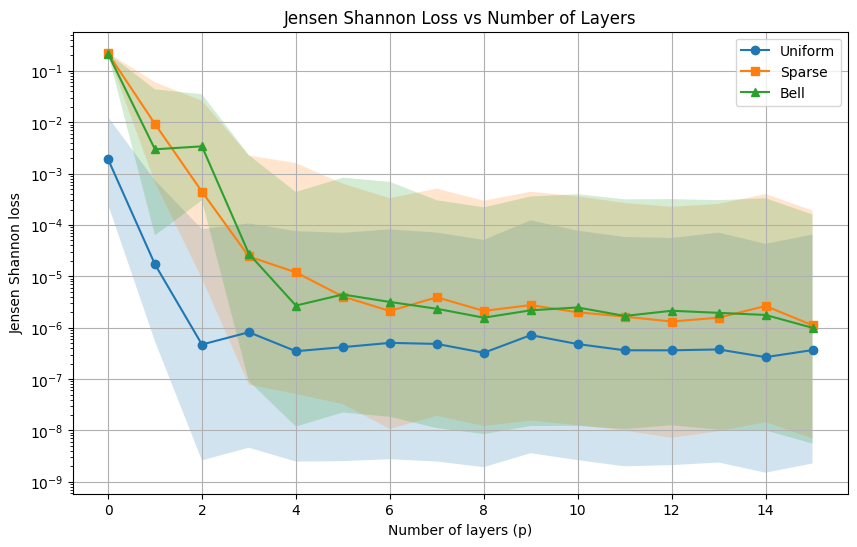

{2: {'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
    tensor(1.71202285e-05, requires_grad=True),
    tensor(4.71378194e-07, requires_grad=True),
    tensor(8.17554637e-07, requires_grad=True),
    tensor(3.49191343e-07, requires_grad=True),
    tensor(4.18886386e-07, requires_grad=True),
    tensor(5.07025588e-07, requires_grad=True),
    tensor(4.84320662e-07, requires_grad=True),
    tensor(3.25172145e-07, requires_grad=True),
    tensor(7.1803954e-07, requires_grad=True),
    tensor(4.80717603e-07, requires_grad=True),
    tensor(3.64120257e-07, requires_grad=True),
    tensor(3.63270306e-07, requires_grad=True),
    tensor(3.77972169e-07, requires_grad=True),
    tensor(2.67473993e-07, requires_grad=True),
    tensor(3.67301596e-07, requires_grad=True)],
   'iqrs_25': [tensor(0.00025376, requires_grad=True),
    tensor(5.43098257e-07, requires_grad=True),
    tensor(2.61882166e-09, requires_grad=True),
    tensor(4.61375228e-09, requires_grad=True),
    tensor(2

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 2  # Number of qubits (N = 2)

# Run the optimizer for each dataset and collect the results

datasets = {
    "Uniform": generate_uniform_distribution(num_qubits),
    "Sparse": generate_sparse_distribution(num_qubits),
    "Bell": generate_bell_state_distribution(),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)


serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)
generated_data


FIG 1: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 2) as a function of the number of layers (set to 15, Adjusted based on the figure ).

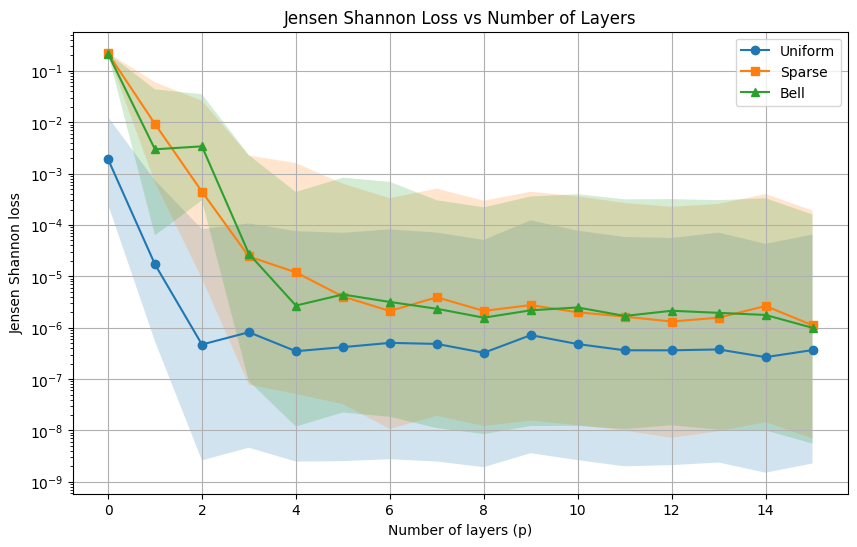

{'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
   tensor(1.71202285e-05, requires_grad=True),
   tensor(4.71378194e-07, requires_grad=True),
   tensor(8.17554637e-07, requires_grad=True),
   tensor(3.49191343e-07, requires_grad=True),
   tensor(4.18886386e-07, requires_grad=True),
   tensor(5.07025588e-07, requires_grad=True),
   tensor(4.84320662e-07, requires_grad=True),
   tensor(3.25172145e-07, requires_grad=True),
   tensor(7.1803954e-07, requires_grad=True),
   tensor(4.80717603e-07, requires_grad=True),
   tensor(3.64120257e-07, requires_grad=True),
   tensor(3.63270306e-07, requires_grad=True),
   tensor(3.77972169e-07, requires_grad=True),
   tensor(2.67473993e-07, requires_grad=True),
   tensor(3.67301596e-07, requires_grad=True)],
  'iqrs_25': [tensor(0.00025376, requires_grad=True),
   tensor(5.43098257e-07, requires_grad=True),
   tensor(2.61882166e-09, requires_grad=True),
   tensor(4.61375228e-09, requires_grad=True),
   tensor(2.48103445e-09, requires_

In [ ]:
plot_generated_data(generated_data[num_qubits])
generated_data[num_qubits]

The code below is for:

FIG 2: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 3) as a function of the number of layers (set to 15, Adjusted based on the figure ).

Processing datasets:   0%|          | 0/3 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

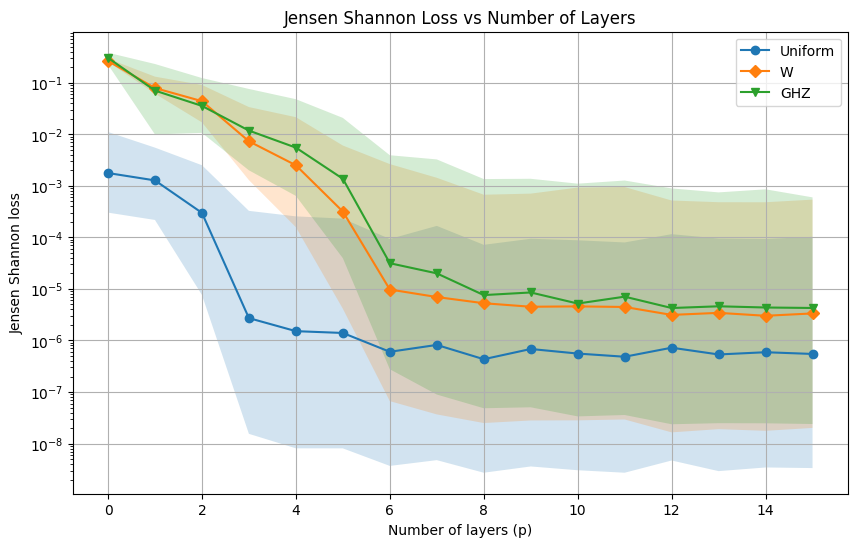

{2: {'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
    tensor(1.71202285e-05, requires_grad=True),
    tensor(4.71378194e-07, requires_grad=True),
    tensor(8.17554637e-07, requires_grad=True),
    tensor(3.49191343e-07, requires_grad=True),
    tensor(4.18886386e-07, requires_grad=True),
    tensor(5.07025588e-07, requires_grad=True),
    tensor(4.84320662e-07, requires_grad=True),
    tensor(3.25172145e-07, requires_grad=True),
    tensor(7.1803954e-07, requires_grad=True),
    tensor(4.80717603e-07, requires_grad=True),
    tensor(3.64120257e-07, requires_grad=True),
    tensor(3.63270306e-07, requires_grad=True),
    tensor(3.77972169e-07, requires_grad=True),
    tensor(2.67473993e-07, requires_grad=True),
    tensor(3.67301596e-07, requires_grad=True)],
   'iqrs_25': [tensor(0.00025376, requires_grad=True),
    tensor(5.43098257e-07, requires_grad=True),
    tensor(2.61882166e-09, requires_grad=True),
    tensor(4.61375228e-09, requires_grad=True),
    tensor(2

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 3  # Number of qubits (N = 3)

# Run the optimizer for each dataset and collect the results

datasets = {
    "Uniform": generate_uniform_distribution(num_qubits),
    "W": generate_w_state_distribution(),
    "GHZ": generate_ghz_state_distribution(num_qubits),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)
serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)
generated_data


The code below is for:

FIG 3: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 4) as a function of the number of layers (set to 15, Adjusted based on the figure ).

Processing datasets:   0%|          | 0/2 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

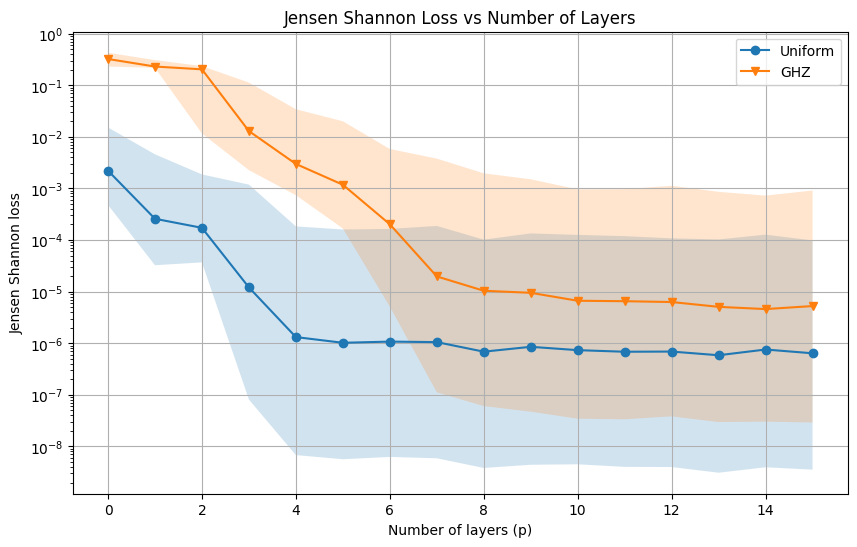

{2: {'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
    tensor(1.71202285e-05, requires_grad=True),
    tensor(4.71378194e-07, requires_grad=True),
    tensor(8.17554637e-07, requires_grad=True),
    tensor(3.49191343e-07, requires_grad=True),
    tensor(4.18886386e-07, requires_grad=True),
    tensor(5.07025588e-07, requires_grad=True),
    tensor(4.84320662e-07, requires_grad=True),
    tensor(3.25172145e-07, requires_grad=True),
    tensor(7.1803954e-07, requires_grad=True),
    tensor(4.80717603e-07, requires_grad=True),
    tensor(3.64120257e-07, requires_grad=True),
    tensor(3.63270306e-07, requires_grad=True),
    tensor(3.77972169e-07, requires_grad=True),
    tensor(2.67473993e-07, requires_grad=True),
    tensor(3.67301596e-07, requires_grad=True)],
   'iqrs_25': [tensor(0.00025376, requires_grad=True),
    tensor(5.43098257e-07, requires_grad=True),
    tensor(2.61882166e-09, requires_grad=True),
    tensor(4.61375228e-09, requires_grad=True),
    tensor(2

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 4  # Number of qubits (N = 4)

# Run the optimizer for each dataset and collect the results

datasets = {
    "Uniform": generate_uniform_distribution(num_qubits),
    "GHZ": generate_ghz_state_distribution(num_qubits),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)
serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)
generated_data


The code below is for:

FIG 4: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 6) as a function of the number of layers (set to 15, Adjusted based on the figure ).

Processing datasets:   0%|          | 0/2 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

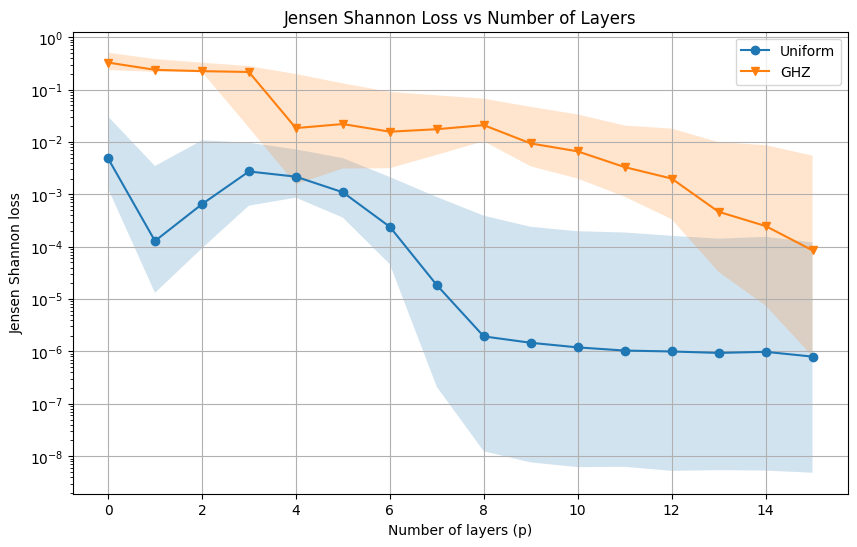

{2: {'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
    tensor(1.71202285e-05, requires_grad=True),
    tensor(4.71378194e-07, requires_grad=True),
    tensor(8.17554637e-07, requires_grad=True),
    tensor(3.49191343e-07, requires_grad=True),
    tensor(4.18886386e-07, requires_grad=True),
    tensor(5.07025588e-07, requires_grad=True),
    tensor(4.84320662e-07, requires_grad=True),
    tensor(3.25172145e-07, requires_grad=True),
    tensor(7.1803954e-07, requires_grad=True),
    tensor(4.80717603e-07, requires_grad=True),
    tensor(3.64120257e-07, requires_grad=True),
    tensor(3.63270306e-07, requires_grad=True),
    tensor(3.77972169e-07, requires_grad=True),
    tensor(2.67473993e-07, requires_grad=True),
    tensor(3.67301596e-07, requires_grad=True)],
   'iqrs_25': [tensor(0.00025376, requires_grad=True),
    tensor(5.43098257e-07, requires_grad=True),
    tensor(2.61882166e-09, requires_grad=True),
    tensor(4.61375228e-09, requires_grad=True),
    tensor(2

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 6  # Number of qubits (N = 2)

# Run the optimizer for each dataset and collect the results

datasets = {
    "Uniform": generate_uniform_distribution(num_qubits),
    "GHZ": generate_ghz_state_distribution(num_qubits),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)
serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)

generated_data

The code below is for:

FIG 5: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 8) as a function of the number of layers (set to 15, Adjusted based on the figure ).

Processing datasets:   0%|          | 0/1 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/200 [00:00<?, ?iter/s]

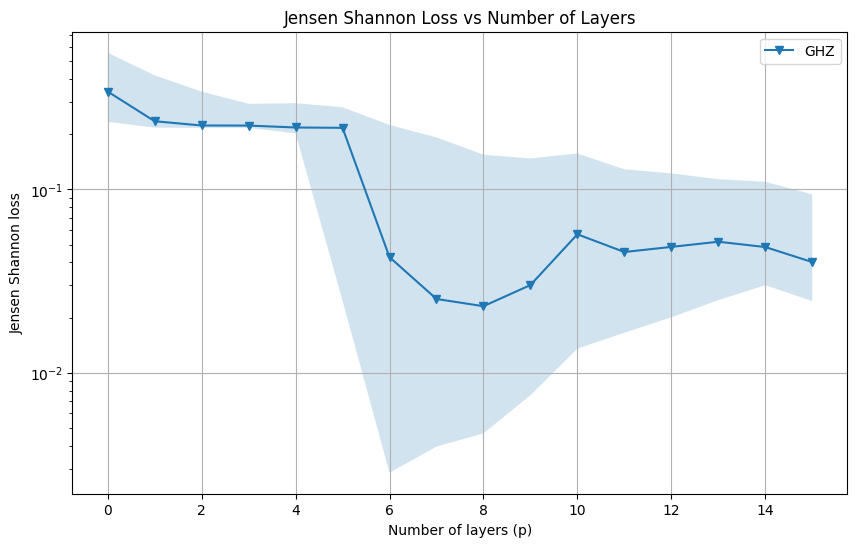

{2: {'Uniform': {'medians': [tensor(0.00191718, requires_grad=True),
    tensor(1.71202285e-05, requires_grad=True),
    tensor(4.71378194e-07, requires_grad=True),
    tensor(8.17554637e-07, requires_grad=True),
    tensor(3.49191343e-07, requires_grad=True),
    tensor(4.18886386e-07, requires_grad=True),
    tensor(5.07025588e-07, requires_grad=True),
    tensor(4.84320662e-07, requires_grad=True),
    tensor(3.25172145e-07, requires_grad=True),
    tensor(7.1803954e-07, requires_grad=True),
    tensor(4.80717603e-07, requires_grad=True),
    tensor(3.64120257e-07, requires_grad=True),
    tensor(3.63270306e-07, requires_grad=True),
    tensor(3.77972169e-07, requires_grad=True),
    tensor(2.67473993e-07, requires_grad=True),
    tensor(3.67301596e-07, requires_grad=True)],
   'iqrs_25': [tensor(0.00025376, requires_grad=True),
    tensor(5.43098257e-07, requires_grad=True),
    tensor(2.61882166e-09, requires_grad=True),
    tensor(4.61375228e-09, requires_grad=True),
    tensor(2

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 8  # Number of qubits (N = 2)

# Run the optimizer for each dataset and collect the results

datasets = {
    "GHZ": generate_ghz_state_distribution(num_qubits),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)
serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)
generated_data


The following code is used to open the saved JSON file.

In [ ]:
# Read the JSON file

with open(file_path, "r") as file:
    json_data = json.load(file)
# Convert the loaded data to a dictionary with NumPy arrays

generated_data = convert_to_numpy(json_data)

# Print the resulting dictionary

print(generated_data)


{'2': {'Uniform': {'medians': tensor([1.91717616e-03, 1.71202285e-05, 4.71378194e-07, 8.17554637e-07,
        3.49191343e-07, 4.18886386e-07, 5.07025588e-07, 4.84320662e-07,
        3.25172145e-07, 7.18039540e-07, 4.80717603e-07, 3.64120257e-07,
        3.63270306e-07, 3.77972169e-07, 2.67473993e-07, 3.67301596e-07], requires_grad=True), 'iqrs_25': tensor([2.53761115e-04, 5.43098257e-07, 2.61882166e-09, 4.61375228e-09,
        2.48103445e-09, 2.52673633e-09, 2.75943548e-09, 2.48452934e-09,
        1.93048382e-09, 3.61132375e-09, 2.64212250e-09, 2.00654561e-09,
        2.11331134e-09, 2.37720866e-09, 1.50455563e-09, 2.27804532e-09], requires_grad=True), 'iqrs_75': tensor([1.25861193e-02, 7.42472637e-04, 8.32160989e-05, 1.07182535e-04,
        7.59703825e-05, 7.05805290e-05, 8.22164102e-05, 7.11040639e-05,
        5.12552193e-05, 1.23290679e-04, 7.74323599e-05, 5.84645789e-05,
        5.59022671e-05, 7.10664846e-05, 4.29493962e-05, 6.52744950e-05], requires_grad=True)}, 'Sparse': {'media

FIG 1: Median (markers) and IQR (shaded) of final losses obtained over 10 QCBM training runs ((`num_qubits`)N = 2) as a function of the number of layers (set to 15, Adjusted based on the figure ).

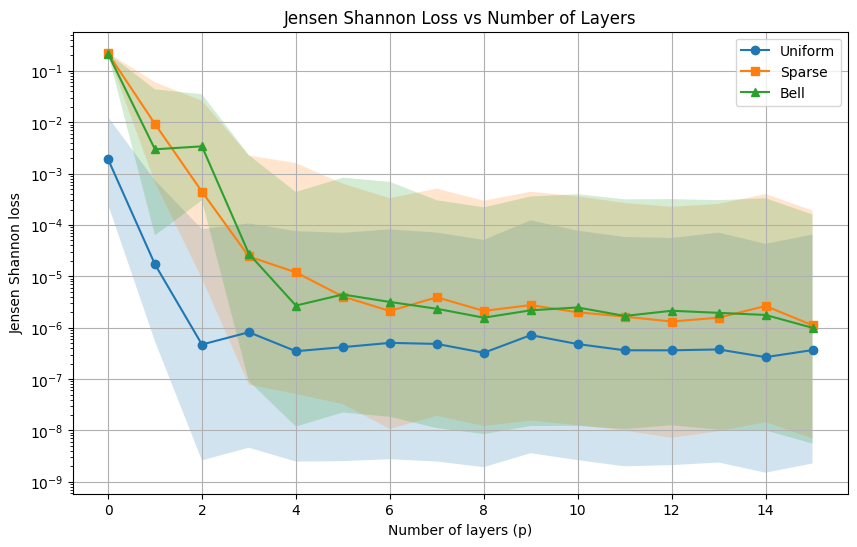

In [ ]:
# Extract the generated data for num_qubits = 2
generated_data_2 = generated_data['2']
plot_generated_data(generated_data_2)

# Creating a Table from Generated Data

This codeblock demonstrates how to create a table from the generated data using the pandas library. The `create_table` function takes the `generated_data` dictionary and an optional `epsilon` parameter, and returns a pandas DataFrame containing the processed data. This function generates the table found in Table 1 of the paper.

## Code Explanation

The `create_table` function performs the following steps:

1. It initializes an empty list called `rows` to store the processed data.

2. It iterates over each key-value pair in the `generated_data` dictionary, where the key represents the number of qubits (`num_qubits`) and the value is another dictionary (`data`) containing dataset-specific data.

3. For each dataset in `data`, it retrieves the "medians" list from the corresponding `dataset_data` dictionary.

4. It finds the index (`pc_obs`) of the first element in the "medians" list that is less than the specified `epsilon` value. If no such element is found, it sets `pc_obs` to the length of the "medians" list.

5. It appends a new row to the `rows` list, containing the following information:
   - `num_qubits`: The number of qubits.
   - `"|0⟩"`: A string representing the initial state (in this case, the computational basis state |0⟩).
   - `dataset_name`: The name of the dataset.
   - `pc_obs`: The index of the first element in the "medians" list that is less than `epsilon`.

6. After processing all the datasets, it creates a pandas DataFrame called `df` using the `pd.DataFrame` constructor. The `rows` list is passed as the data, and the column names are specified as `["nqubits", "|ψ0⟩", "target", "pc(obs)"]`.

7. Finally, it returns the created DataFrame `df`.



In [ ]:
import pandas as pd


def create_table(generated_data, epsilon=1e-8):
    rows = []
    for num_qubits, data in generated_data.items():
        for dataset_name, dataset_data in data.items():
            medians = dataset_data["medians"]
            pc_obs = next(
                (i for i, val in enumerate(medians) if val < epsilon), len(medians)
            )
            rows.append([num_qubits, "|0⟩", dataset_name, pc_obs])
    df = pd.DataFrame(rows, columns=["nqubits", "|ψ0⟩", "target", "pc(obs)"])
    return df


In [ ]:
create_table(generated_data)

,nqubits,|ψ0⟩,target,pc(obs)
0,2,|0⟩,Uniform,16
1,2,|0⟩,Sparse,16
2,2,|0⟩,Bell,16
3,3,|0⟩,Uniform,16
4,3,|0⟩,W,16
5,3,|0⟩,GHZ,16
6,4,|0⟩,Uniform,16
7,4,|0⟩,GHZ,16
8,6,|0⟩,Uniform,16
9,6,|0⟩,GHZ,16


The overall trend of the Jensen-Shannon (JS) loss decreasing as the number of layers increases is consistent with the paper's findings. The plateau layer, where the JS loss saturates to a low value, is also consistent with the paper for the 4-qubit case.
However, there are some differences observed in the specific JS loss values compared to the paper's plots. For example, to consistently achieve a JS loss below 10^-8 across multiple training runs, around 300 runs were required, which is higher than the paper's results.

These differences could potentially arise from variations in the implementation details of the ansatz circuit used, as the paper only explicitly mentions the hardware-efficient ansatz for the 4-qubit case. The ansatz implementation for other qubit counts may differ between the paper and the experiments conducted here.

We will now plot the losses obtained as a function of the number of layers, for N=2 q bits, for 300 iternations to see the difference

Optimizer function with `num_its = 300`,

In [6]:
def optimizer(num_qubits, num_layers, dataset):
    dev = qml.device("default.qubit", wires=num_qubits)

    def encode():
        qml.BasisState(np.zeros(num_qubits), wires=range(num_qubits))

    @qml.qnode(dev)
    def qcbm(params):
        encode()
        ansatz(params, num_layers, num_qubits)
        return qml.probs()

    params_size = 4 * (num_qubits - 1) * num_layers + 2 * num_qubits
    params = np.random.uniform(low=0, high=2 * np.pi, size=(params_size,))

    # Set up the optimizer; you may wish to tune the stepsize
    # or number of iterations.

    opt = qml.AdamOptimizer(stepsize=0.01, beta1=0.9, beta2=0.999)

    num_its = 300
    loss_over_time = []

    for _ in tqdm(range(num_its), desc="Iterations", unit="iter", leave=False):
        # Compute the gradients

        params, loss_value = opt.step_and_cost(lambda p: loss(dataset, qcbm, p), params)
        loss_over_time.append(loss_value)
    return dataset, qcbm(params), loss_over_time


In [7]:
generated_data = {num_qubits: {} for num_qubits in [2]}

# Convert tensors to regular Python objects

def convert_to_serializable(data):
    if isinstance(data, dict):
        return {k: convert_to_serializable(v) for k, v in data.items()}
    elif isinstance(data, list):
        return [convert_to_serializable(v) for v in data]
    elif isinstance(data, (np.ndarray, np.generic)):
        return data.tolist()
    else:
        return data


def convert_to_numpy(data):
    if isinstance(data, dict):
        return {k: convert_to_numpy(v) for k, v in data.items()}
    elif isinstance(data, list):
        return np.array(data)
    else:
        return data


In [ ]:
#from google.colab import drive
#drive.mount('/content/drive')

import os

# drive_path = '/content/drive/MyDrive/CPEN 400Q Group 8/QCBM'

# Create the directory if it doesn't exist
# os.makedirs(drive_path, exist_ok=True)

# Define the file path for saving the JSON file for the JSD loss data
file_path = os.path.join('', 'generated_data_disc.json')
file_path

'generated_data_disc.json'

Processing datasets:   0%|          | 0/3 [00:00<?, ?dataset/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

Iterations:   0%|          | 0/300 [00:00<?, ?iter/s]

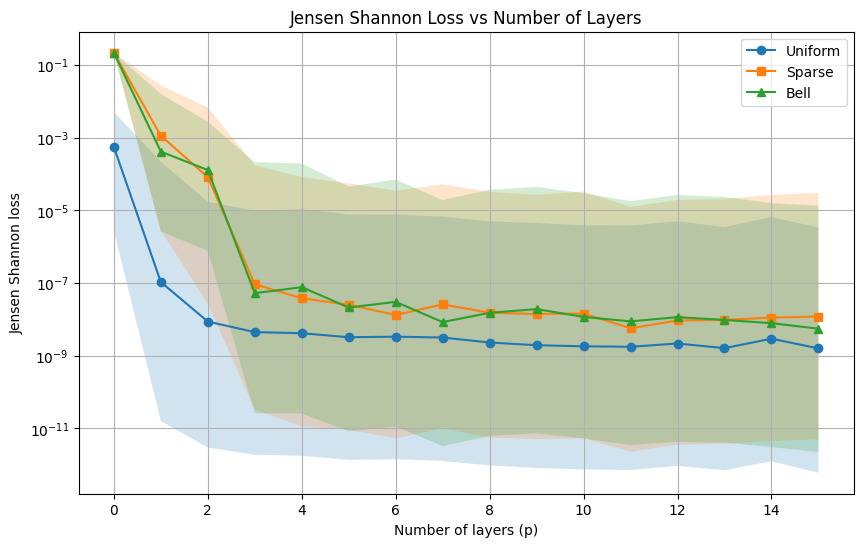

{2: {'Uniform': {'medians': [tensor(0.00055267, requires_grad=True),
    tensor(1.05563169e-07, requires_grad=True),
    tensor(8.63243125e-09, requires_grad=True),
    tensor(4.41553974e-09, requires_grad=True),
    tensor(4.12386036e-09, requires_grad=True),
    tensor(3.19654097e-09, requires_grad=True),
    tensor(3.30872422e-09, requires_grad=True),
    tensor(3.13169814e-09, requires_grad=True),
    tensor(2.28727998e-09, requires_grad=True),
    tensor(1.92823269e-09, requires_grad=True),
    tensor(1.79820864e-09, requires_grad=True),
    tensor(1.7467083e-09, requires_grad=True),
    tensor(2.14721603e-09, requires_grad=True),
    tensor(1.5981592e-09, requires_grad=True),
    tensor(2.91741062e-09, requires_grad=True),
    tensor(1.57347231e-09, requires_grad=True)],
   'iqrs_25': [tensor(2.67810156e-06, requires_grad=True),
    tensor(1.58393824e-11, requires_grad=True),
    tensor(2.94013344e-12, requires_grad=True),
    tensor(1.86400546e-12, requires_grad=True),
    tenso

In [ ]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 2  # Number of qubits (N = 2)

# Run the optimizer for each dataset and collect the results

datasets = {
    "Uniform": generate_uniform_distribution(num_qubits),
    "Sparse": generate_sparse_distribution(num_qubits),
    "Bell": generate_bell_state_distribution(),
}

generated_data[num_qubits] = figure_creator(
    min_layers, max_layers, num_runs, num_qubits, datasets
)


serializable_data = convert_to_serializable(generated_data)

with open(file_path, "w") as file:
    json.dump(serializable_data, file)

generated_data

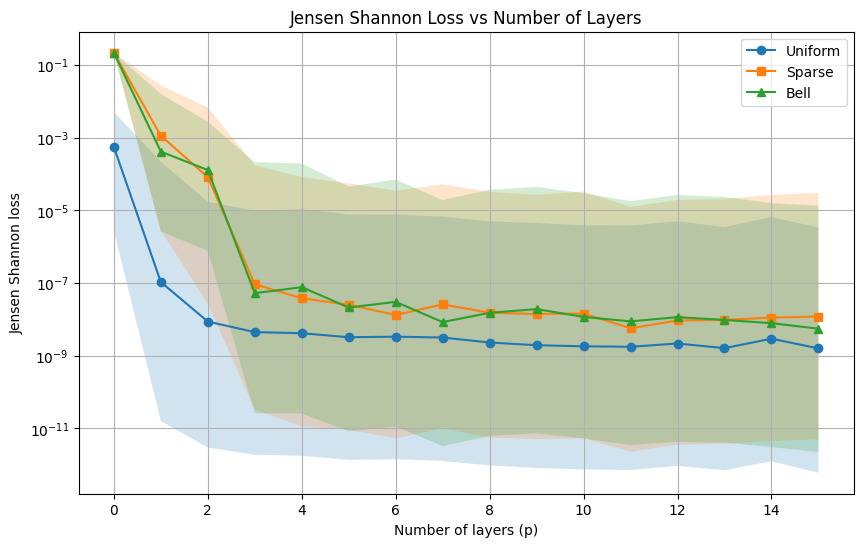

{'Uniform': {'medians': [tensor(0.00055267, requires_grad=True),
   tensor(1.05563169e-07, requires_grad=True),
   tensor(8.63243125e-09, requires_grad=True),
   tensor(4.41553974e-09, requires_grad=True),
   tensor(4.12386036e-09, requires_grad=True),
   tensor(3.19654097e-09, requires_grad=True),
   tensor(3.30872422e-09, requires_grad=True),
   tensor(3.13169814e-09, requires_grad=True),
   tensor(2.28727998e-09, requires_grad=True),
   tensor(1.92823269e-09, requires_grad=True),
   tensor(1.79820864e-09, requires_grad=True),
   tensor(1.7467083e-09, requires_grad=True),
   tensor(2.14721603e-09, requires_grad=True),
   tensor(1.5981592e-09, requires_grad=True),
   tensor(2.91741062e-09, requires_grad=True),
   tensor(1.57347231e-09, requires_grad=True)],
  'iqrs_25': [tensor(2.67810156e-06, requires_grad=True),
   tensor(1.58393824e-11, requires_grad=True),
   tensor(2.94013344e-12, requires_grad=True),
   tensor(1.86400546e-12, requires_grad=True),
   tensor(1.74075044e-12, requir

In [ ]:
plot_generated_data(generated_data[num_qubits])
generated_data[num_qubits]

The code below is for a modifed optimizer for FIG 7

In [8]:
def optimizer(num_qubits, num_layers, dataset):
    dev = qml.device("default.qubit", wires=num_qubits)

    def encode():
        qml.BasisState(np.zeros(num_qubits), wires=range(num_qubits))

    @qml.qnode(dev)
    def qcbm(params):
        encode()
        ansatz(params, num_layers, num_qubits)
        return qml.probs()

    params_size = 4 * (num_qubits - 1) * num_layers + 2 * num_qubits
    params = np.random.uniform(low=0, high=2 * np.pi, size=(params_size,))

    # Set up the optimizer; you may wish to tune the stepsize
    # or number of iterations.

    opt = qml.AdamOptimizer(stepsize=0.01, beta1=0.9, beta2=0.999)

    num_its = 0
    loss_value = 1  # initial value

    while loss_value > 10**-8:
        params, loss_value = opt.step_and_cost(lambda p: loss(dataset, qcbm, p), params)
        num_its += 1  # Increment counter
        if num_its >= 1000:
            break
    return dataset, qcbm(params), num_its


In [9]:
def run_optimizer_for_dataset(dataset, num_qubits, min_layers, max_layers, num_runs):
    its_per_layer = {num_layers: [] for num_layers in range(min_layers, max_layers + 1)}

    for num_layers in tqdm(
        range(min_layers, max_layers + 1), desc="Layers", unit="layer", leave=False
    ):
        for run in tqdm(range(num_runs), desc="Runs", unit="run", leave=False):
            *_, num_its = optimizer(num_qubits, num_layers, dataset)
            its_per_layer[num_layers].append(num_its)
    medians = []
    iqrs_25 = []
    iqrs_75 = []

    for num_layers in range(min_layers, max_layers + 1):
        median_its = np.median(np.array(its_per_layer[num_layers]))
        iqr_25 = median_its
        iqr_75 = median_its
        if num_runs > 1:
            iqr_25, iqr_75 = np.percentile(
                np.array(its_per_layer[num_layers]), [25, 75]
            )
        medians.append(median_its)
        iqrs_25.append(iqr_25)
        iqrs_75.append(iqr_75)
    return medians, iqrs_25, iqrs_75


In [10]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 2  # Number of qubits (N = 2)


medians, iqrs_25, iqrs_75 = run_optimizer_for_dataset(
    generate_uniform_distribution(num_qubits),
    num_qubits,
    min_layers,
    max_layers,
    num_runs,
)
generated_data = {"medians": medians, "iqrs_25": iqrs_25, "iqrs_75": iqrs_75}


Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

In [17]:
def plot_generated_data(generated_data):
    # Find the first available dataset to determine max_layers

    max_layers = len(generated_data["medians"])

    # Define the range of layers

    min_layers = 0
    layer_range = range(min_layers, max_layers)

    # Plot the final losses on a linear scale

    plt.figure(figsize=(10, 6))
    dataset_data = generated_data

    medians = dataset_data["medians"]
    iqrs_25 = dataset_data["iqrs_25"]
    iqrs_75 = dataset_data["iqrs_75"]

    plt.plot(layer_range, medians, label="n=2", marker="o")
    plt.fill_between(layer_range, np.array(iqrs_25), np.array(iqrs_75), alpha=0.2)

    # Set the y-axis limits to 500 to 100

    plt.ylim(50, 1000)

    plt.xlabel("Number of parameters")
    plt.ylabel("Time to Solution")
    plt.title("Time to Solution vs Number of parameters")
    plt.legend()
    plt.grid(True)
    plt.show()


FIG 7: Median (markers) and IQR (shaded)
TTS[ϵ = 10−8] evaluated over the Uniform Targets, used to train 2 qbit QCBMs plotted as a function of the number of parameters.

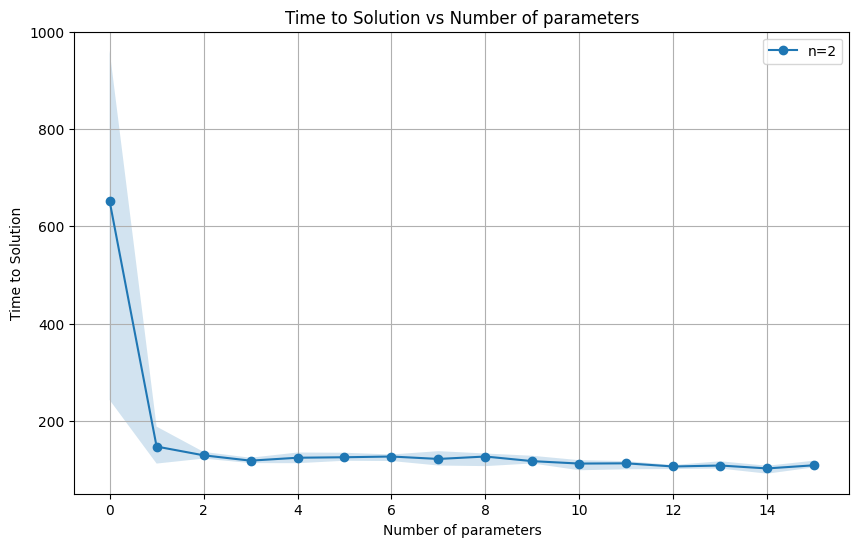

In [18]:
plot_generated_data(generated_data)

In [19]:
# Define the range of layers to test

min_layers = 0
max_layers = 15  # Adjust based on the figure
num_runs = 10  # Number of runs per layer configuration
num_qubits = 2  # Number of qubits (N = 2)

medians, iqrs_25, iqrs_75 = run_optimizer_for_dataset(
    generate_bell_state_distribution(), num_qubits, min_layers, max_layers, num_runs
)
generated_data = {"medians": medians, "iqrs_25": iqrs_25, "iqrs_75": iqrs_75}


Layers:   0%|          | 0/16 [00:00<?, ?layer/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

Runs:   0%|          | 0/10 [00:00<?, ?run/s]

FIG 8: Median (markers) and IQR (shaded)
TTS[ϵ = 10−8] evaluated over the Bell Targets, used to train 2 qbit QCBMs plotted as a function of the number of parameters.

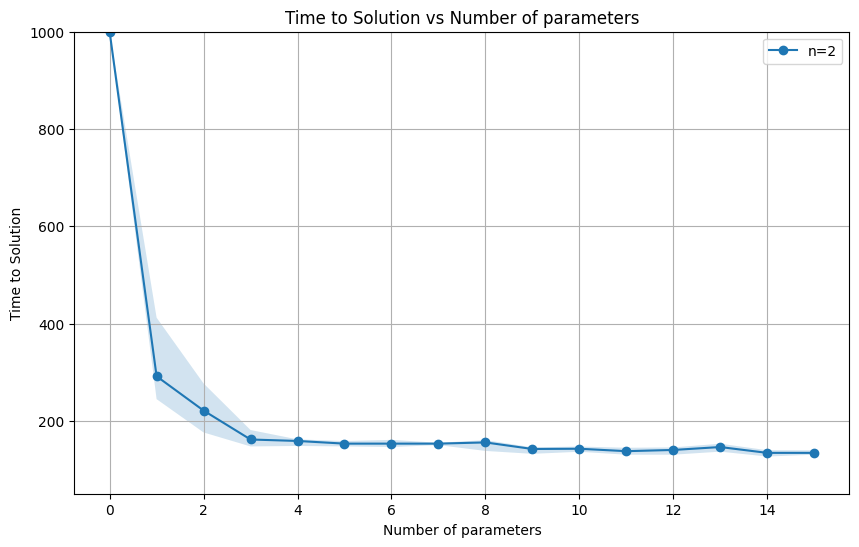

In [20]:
plot_generated_data(generated_data)

Below is the older version of the code for plotting the Jensen-Shannon Loss across various layers highlighted unexpected results. These discrepancies were instrumental in identifying a bug within the ansatz function. Consequently, this prompted us to explore an alternative approach, bypassing the use of JAX.

Results with the code below:





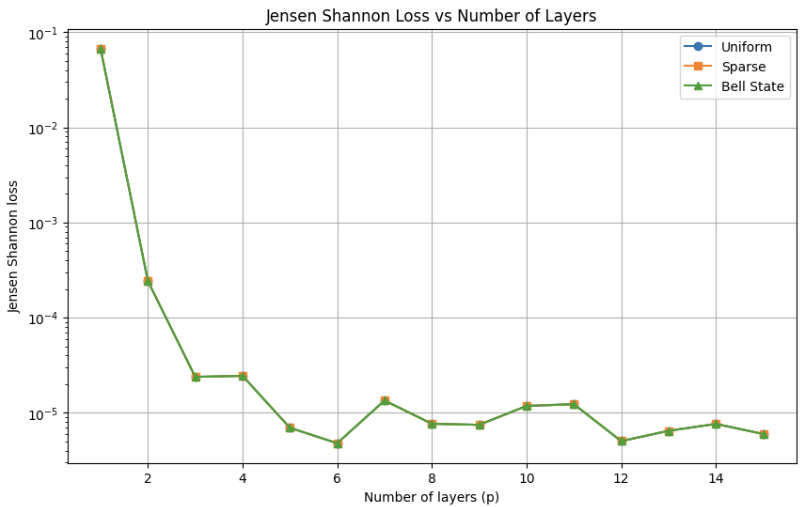

In [ ]:
# def optimizerz(num_qubits, num_layers, dataset):
#     dev = qml.device("default.qubit", wires=num_qubits)

#     def encode():
#         qml.BasisState(np.zeros(num_qubits), wires=range(num_qubits))

#     @jax.jit
#     @qml.qnode(dev, interface='jax')
#     def qcbm(params):
#         encode()
#         ansatz(params,num_layers,num_qubits)
#         return qml.probs()


#     params_size = 4 * (num_qubits - 1) * num_layers + 2 * num_qubits
#     params = jax.random.uniform(key=jax.random.PRNGKey(0),shape=(params_size,), minval=0, maxval=2 * jnp.pi)

#     # Set up the optimizer; you may wish to tune the stepsize
#     # or number of iterations.
#     opt = optax.adam(learning_rate=0.01, b1=0.9, b2=0.999, eps=1e-10)

#     # Initialize optimizer state
#     opt_state = opt.init(params)

#     num_its = 200
#     loss_over_time = []

#     for _ in range(num_its):
#         # Compute the gradients
#         loss_value, grads = jax.value_and_grad(lambda p: loss(train_X, qcbm, p))(params)

#         # Update the parameters using the optimizer
#         updates, opt_state = opt.update(grads, opt_state)
#         params = optax.apply_updates(params, updates)

#         loss_over_time.append(loss_value)

#     median_loss = np.median(loss_over_time)

#     return median_loss

#     num_qubits = 4
#     bell_state_dist = generate_bell_state_distribution()
#     uniform_dist = generate_uniform_distribution(num_qubits)
#     sparse_dist = generate_sparse_distribution(num_qubits)

#     bell_state_losses = []
#     uniform_losses = []
#     sparse_losses = []

#     for num_layers in range(1, 16):  # Assuming we want to test from 1 to 15 layers
#     # Optimize and get the final loss for the uniform distribution
#     median_loss_bell = optimizerz(num_qubits, num_layers, bell_state_dist)
#     bell_state_losses.append(median_loss_bell)

#     median_loss_uniform = optimizerz(num_qubits, num_layers, uniform_dist)
#     uniform_losses.append(median_loss_uniform)

#     median_loss_sparse = optimizerz(num_qubits, num_layers, sparse_dist)
#     sparse_losses.append(median_loss_sparse)

#     # Plot the final losses on a log scale
#     plt.figure(figsize=(10, 6))
#     plt.semilogy(range(1, 16), uniform_losses, label='Uniform', marker='o')
#     plt.semilogy(range(1, 16), sparse_losses, label='Sparse', marker='s')
#     plt.semilogy(range(1, 16), bell_state_losses, label='Bell State', marker='^')
#     plt.xlabel('Number of layers (p)')
#     plt.ylabel('Jensen Shannon loss')
#     plt.title('Jensen Shannon Loss vs Number of Layers')
#     plt.legend()
#     plt.grid(True)
#     plt.show()